In [1]:
import h5py
import math
import bisect
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib
import matplotlib.font_manager
import matplotlib.pyplot as plt
matplotlib.font_manager._rebuild()
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})
matplotlib.rc('text', usetex=True)
matplotlib.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]
# for Palatino and other serif fonts use:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
import seaborn as sns

In [5]:
class Data:
    def __init__(self, file):
        self.x = np.array(file['BubbleScale/Variable'])
        self.imagx = np.array(file['BubbleScale/Imag'])
        self.realx = np.array(file['BubbleScale/Real'])
        self.imagDeriv = np.array(file['BubbleScale/ImagDeriv'])
        self.alpha = file['BubbleScale'].attrs['alphaT']
                
        self.aPos = file['SelfEnergy'].attrs['aPos']
        self.aNeg = file['SelfEnergy'].attrs['aNeg']
        self.M = file['SelfEnergy'].attrs['M']
        self.N = file['SelfEnergy'].attrs['N']
        self.v = file['SelfEnergy'].attrs['v']
        self.b = file['SelfEnergy'].attrs['b']
        
        self.etaOmega = self.M/(self.N*math.pi)*(self.aPos+self.aNeg)
        
        self.arpos = np.array(file['SelfEnergyRadial/arPos'])
        self.arneg = np.array(file['SelfEnergyRadial/arNeg'])
        self.radInterPos = np.array(file['SelfEnergyRadial/radInterPos'])
        self.radInterNeg = np.array(file['SelfEnergyRadial/radInterNeg'])
        
        self.kr = np.array(file['SelfEnergyRadial/kr'])
        self.radSePos = np.array(file['SelfEnergyRadial/seRadPos'])
        self.radSeNeg = np.array(file['SelfEnergyRadial/seRadNeg'])
        
        self.integrand = self.arneg - self.arpos + self.aPos - self.aNeg

        self.negKr = -self.kr[::-1]
        self.fullK = np.concatenate((self.negKr,self.kr))
        self.fullSe = np.concatenate((self.radSeNeg[::-1],self.radSePos))
        
        def etaPos(self):
            logKr = np.log(self.kr)
            posRatio = self.radSePos/self.kr
            slope, intercept, r, p, std_err = stats.linregress(logKr, posRatio)
            return -slope
        
        def etaNeg(self):
            logKr = np.log(self.kr)
            negRatio = -self.radSeNeg/self.kr
            slope, intercept, r, p, std_err = stats.linregress(logKr, negRatio)
            return -slope
        
        self.etaRPlus = etaPos(self)
        self.etaRMinus = etaNeg(self)
        
        
        self.ktilde = np.array(file['SelfEnergyTangential/ktilde'])
        self.atPos = np.array(file['SelfEnergyTangential/atPos'])
        self.atNeg = np.array(file['SelfEnergyTangential/atNeg'])
        self.interk = np.array(file['SelfEnergyTangential/interk'])
        self.subtractPos = np.array(file['SelfEnergyTangential/subtractPos'])
        self.subtractNeg = np.array(file['SelfEnergyTangential/subtractNeg'])
        #self.freqs = np.array(file['SelfEnergyTangential/freqs'])
        #self.freqPos = np.array(file['SelfEnergyTangential/freqPos'])
        #self.freqNeg = np.array(file['SelfEnergyTangential/freqNeg'])
        self.kt = np.array(file['SelfEnergyTangential/kt'])
        self.seTang = np.array(file['SelfEnergyTangential/seTang'])
        
        self.ktAlpha = self.kt**self.alpha
        
        def tangentialSeCoefficient(self):
            slope, intercept, r, p, std_err = stats.linregress(self.ktAlpha, self.seTang)
            return slope
            
        self.uAlpha = tangentialSeCoefficient(self)

In [3]:
class ScalingPlots(Data):
    def __init__(self,file):
        Data.__init__(self,file)
        
# explicit evaluation of imaginary part
    def imagPlot(self):
        def f(x):
            if(x<1/8):
                return 0.0
            else:
                return -1.0/(2.0*math.pi)*math.sqrt(2*math.sqrt(2*(1+x))-3)
        f2 = np.vectorize(f)
        x = np.linspace(self.x[0], self.x[-1], 5000)
        plt.plot(x, f2(x),label='Exact result')
        
        plt.plot(self.x,self.imagx,label='Numerics',linestyle='dashed')
        plt.xlabel(r'$x$',fontsize=20)
        plt.ylabel(r'$ImI_{\alpha}(x)$',fontsize=20)
        plt.xlim([self.x[0],self.x[-1]])
        plt.ylim([-0.5,0.2])
        #plt.axvline(0.0,linewidth=1,color='black',linestyle='--')
        plt.legend()
        plt.show()
  
    def imagDerivPlot(self):
        def f(x):
            if(x<1/8):
                return 0.0
            else:
                return -1.0/(2.0*math.pi*math.sqrt(2*(1+x))*math.sqrt(2*math.sqrt(2*(1+x))-3))
        f2 = np.vectorize(f)
        x = np.linspace(self.x[0], self.x[-1], 5000)
        plt.plot(x, f2(x),label='Exact result')
        
        plt.plot(self.x,self.imagDeriv,label='Numerics',linestyle='dashed')
        plt.xlabel(r'$x$',fontsize=20)
        plt.ylabel(r'$\frac{d}{dx}ImI_{\alpha}(x)$',fontsize=20)
        plt.xlim([self.x[0],self.x[-1]])
        plt.ylim([-0.5,0.2])
        #plt.axvline(0.0,linewidth=1,color='black',linestyle='--')
        plt.legend()
        plt.show()

    def realPlot(self):
        def f(x):
            if(x<1/8):
                return 1.0/(math.pi)*math.sqrt(3/2+math.sqrt(1/4-2*x))
            else:
                return 1.0/(2.0*math.pi)*math.sqrt(2*math.sqrt(2*(1+x))+3)
        f2 = np.vectorize(f)
        x = np.linspace(self.x[0], self.x[-1], 5000)
        plt.plot(x, f2(x),label='Exact result')
        
        plt.plot(self.x,self.realx,label='Numerics',linestyle='dashed')
        plt.xlabel(r'$x$',fontsize=20)
        plt.ylabel(r'$ReI_{\alpha}(x)$',fontsize=20)
        #plt.xlim([-0.2,0.2])
        #plt.ylim([-0.5,0.2])
        #plt.axvline(0.0,linewidth=1,color='black',linestyle='--')
        plt.legend()
        plt.show()
            
    def radPosPlot(self):
        ax = plt.gca()
        plt.plot(self.x,self.arpos)
        plt.xlabel(r'$\tilde{k}_r$',fontsize=20)
        plt.ylabel(r'$A^{(r)}_+(\tilde{k}_r)$',fontsize=20)
        ax.axvline(-1.0, linestyle='--', color='black')
        plt.show()
        
    def radNegPlot(self):
        ax = plt.gca()
        plt.plot(self.x,self.arneg)
        plt.xlabel(r'$\tilde{k}_r$',fontsize=20)
        plt.ylabel(r'$A^{(r)}_-(\tilde{k}_r)$',fontsize=20)
        ax.axvline(1.0, linestyle='--', color='black')
        plt.show()
       
    def radPlot(self):
        ax = plt.gca()
        plt.plot(self.x,self.arpos,linewidth=2,label=r'$A^{(r)}_+$')
        plt.plot(self.x,self.arneg,linewidth=2,label=r'$A^{(r)}_-$')
        plt.xlabel(r'$\tilde{k}_r$',fontsize=20)
        plt.ylabel(r'$A^{(r)}_{\pm}(\tilde{k}_r)$',fontsize=20)
        ax.axvline(-1.0,linewidth=1, linestyle='--', color='black')
        ax.axvline(1.0,linewidth=1, linestyle='--', color='black')
        plt.xlim([-5,5])
        #plt.ylim([0.0,0.15])
        plt.legend(fontsize=15)
        plt.savefig('Graphics/radScale.pdf',bbox_inches="tight")
        plt.show()
        
    def integrandPlot(self):
        ax = plt.gca()
        plt.plot(self.x,self.integrand)
        plt.xlabel(r'$\tilde{k}_r$',fontsize=20)
        plt.ylabel(r'$f(\tilde{k}_r)$',fontsize=20)
        plt.xlim([0,5])
        plt.show()
        
    def radInterPosPlot(self):
        ax = plt.gca()
        plt.plot(self.x,self.radInterPos)
        plt.xlabel(r'$\tilde{k}_r$',fontsize=20)
        plt.ylabel(r'$A^{(r)}_+(\tilde{k}_r)$',fontsize=20)
        ax.axvline(-1.0, linestyle='--', color='black')
        plt.show()  
        
    def radInterNegPlot(self):
        ax = plt.gca()
        plt.plot(self.x,self.radInterNeg)
        plt.xlabel(r'$\tilde{k}_r$',fontsize=20)
        plt.ylabel(r'$A^{(r)}_+(\tilde{k}_r)$',fontsize=20)
        ax.axvline(1.0, linestyle='--', color='black')
        plt.show()  
        
    def seradPosPlot(self):
        plt.plot(self.kr,self.radSePos)
        plt.xlabel(r'$k_r$',fontsize=20)
        plt.ylabel(r'$Re\delta\Sigma(k_r)$',fontsize=20)
        plt.show()   
        
    def seradNegPlot(self):
        plt.plot(-self.kr,self.radSeNeg)
        plt.xlabel(r'$k_r$',fontsize=20)
        plt.ylabel(r'$Re\delta\Sigma(k_r)$',fontsize=20)
        plt.show()   
        
    def seRadPlot(self):
        plt.plot(self.fullK,self.fullSe)
        plt.xlabel(r'$k_r$',fontsize=20)
        plt.ylabel(r'$Re\delta\Sigma(k_r)$',fontsize=20)
        plt.show()
        
    def seradPosLogPlot(self):
        plt.plot(self.kr,self.radSePos/self.kr)
        plt.xlabel(r'$k_r$',fontsize=20)
        plt.ylabel(r'$Re\delta\Sigma(k_r)/k_r$',fontsize=20)
        plt.xscale('log')
        #plt.savefig('Graphics/seRadPosQuartic.pdf',bbox_inches="tight")
        plt.show()   
        
    def seradNegLogPlot(self):
        plt.plot(self.kr,-self.radSeNeg/self.kr)
        plt.xlabel(r'$-k_r$',fontsize=20)
        plt.ylabel(r'$Re\delta\Sigma(k_r)/k_r$',fontsize=20)
        #plt.xlim([-1.0,-1e-4])
        plt.xscale('log')
        #plt.savefig('Graphics/seRadNegQuartic.pdf',bbox_inches="tight")
        plt.show()   
        
    def tangPosPlot(self):
        plt.plot(self.ktilde,self.atPos)
        plt.xlabel(r'$\tilde{k}_t$',fontsize=20)
        plt.ylabel(r'$A^{(t)}_+(\tilde{k}_t)$',fontsize=20)
        plt.show()
        
    def tangNegPlot(self):
        plt.plot(self.ktilde,self.atNeg)
        plt.xlabel(r'$\tilde{k}_t$',fontsize=20)
        plt.ylabel(r'$A^{(t)}_-(\tilde{k}_t)$',fontsize=20)
        plt.show()
       
    def tangPlot(self):
        plt.plot(self.ktilde,self.atPos,linewidth=2,label=r'$A^{(t)}_+$')
        plt.plot(self.ktilde,self.atNeg,linewidth=2,label=r'$A^{(t)}_-$')
        plt.xlabel(r'$\tilde{k}_t$',fontsize=20)
        plt.ylabel(r'$A^{(t)}_{\pm}(\tilde{k}_t)$',fontsize=20)
        #plt.xlim([0,5])
        #plt.ylim([0.0,0.15])
        plt.axvline(1.0,linestyle='--',color='black')
        plt.legend()
        plt.show()
     
    def subtractPlot(self):
        plt.plot(self.interk,self.subtractPos,linewidth=2,label=r'\delta A^{(t)}_+$')
        plt.plot(self.interk,self.subtractNeg,linewidth=2,label=r'\delta A^{(t)}_-$')
        plt.xlabel(r'$\tilde{k}_t$',fontsize=20)
        plt.ylabel(r'$\delta A^{(t)}_{\pm}(\tilde{k}_t)$',fontsize=20)
        #plt.legend(fontsize=15)
        plt.show()
    
    def seTangPlot(self):
        plt.plot(self.kt,self.seTang)
        plt.xlabel(r'$k_t$',fontsize=20)
        plt.ylabel(r'$Re\delta\Sigma(k_t)$',fontsize=20)
        #plt.savefig('Graphics/seTangLinear4.pdf',bbox_inches="tight")
        plt.show()
        
    def seTangDividePlot(self):
        plt.plot(self.kt**4,self.seTang/(self.kt**4))
        plt.xlabel(r'$k_t^4$',fontsize=20)
        plt.ylabel(r'$\frac{Re\delta\Sigma(k_t)}{k_t^4}$',fontsize=20)
        plt.xscale('log')
        #plt.xlim([1e-8,1e-4])
        plt.savefig('Graphics/tangLogQuartic4.pdf',bbox_inches="tight")
        plt.show()
        
    def seTangQuarticPlot(self):
        plt.plot(self.kt**4,self.seTang)
        plt.xlabel(r'$k_t^4$',fontsize=20)
        plt.ylabel(r'$Re\delta\Sigma(k_t)$',fontsize=20)
        #plt.savefig('Graphics/seTangQuartic4.pdf',bbox_inches="tight")
        plt.show()
        
    def seTangAlphaPlot(self):
        plt.plot(self.kt**self.alpha,self.seTang)
        plt.xlabel(r'$k_t^\alpha$',fontsize=20)
        plt.ylabel(r'$Re\delta\Sigma(k_t)$',fontsize=20)
        plt.show()

In [4]:
foo = ScalingPlots(h5py.File('popel1.h5','r'))

In [9]:
bar=ScalingPlots(h5py.File('converged400.h5','r'))

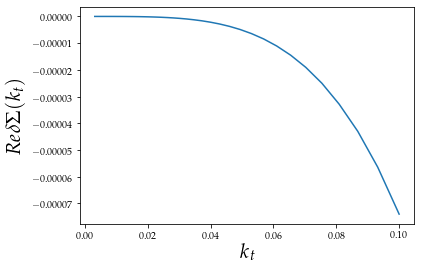

In [11]:
bar.seTangPlot()

In [13]:
false400 = ScalingPlots(h5py.File('quarticTestuFalse400.h5','r'))

In [14]:
false400.uAlpha

0.1082352377371654

In [4]:
foo=ScalingPlots(h5py.File('quarticTestu400.h5','r'))

In [5]:
foo.uAlpha

0.1089840244764091

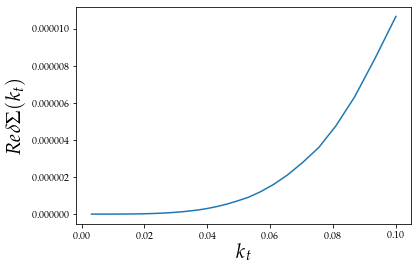

In [8]:
foo.seTangPlot()

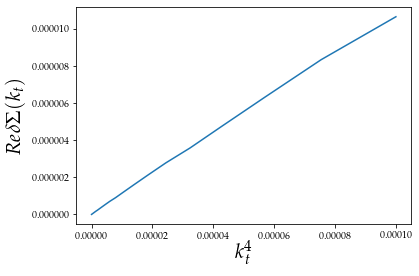

In [12]:
foo.seTangQuarticPlot()

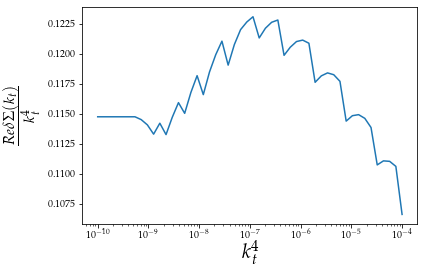

In [6]:
foo.seTangDividePlot()

In [4]:
import glob

file_list = glob.glob('converged*.h5')

In [5]:
alpha = []
u = []
etaPos = []
etaNeg = []
for file_name in file_list:
    foo = ScalingPlots(h5py.File(file_name,'r'))
    alpha.append(foo.alpha)
    u.append(foo.uAlpha)
    etaPos.append(foo.etaRPlus)
    etaNeg.append(foo.etaRMinus)

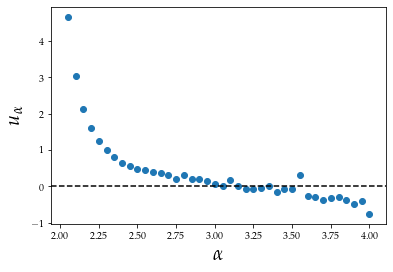

In [6]:
plt.scatter(alpha,u)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$u_{\alpha}$',fontsize=20)
plt.axhline(0.0,linestyle='--',color='black')
plt.savefig('Graphics/tangentialCoefficient.pdf',bbox_inches="tight")
plt.show()

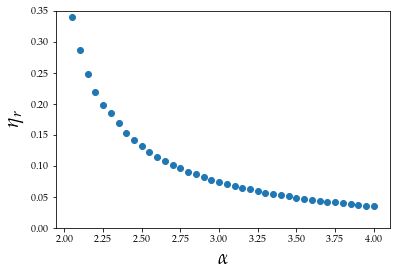

In [13]:
plt.scatter(alpha,etaPos)
#plt.scatter(alpha,etaNeg)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$\eta_r$',fontsize=20)
plt.ylim([0.0,0.35])
#plt.savefig('Graphics/radialEtaPos.pdf',bbox_inches="tight")
plt.show()

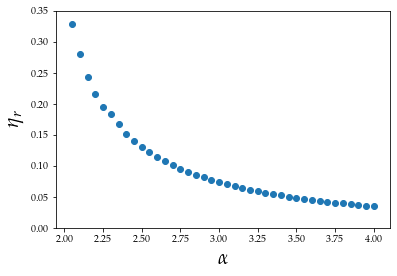

In [14]:
plt.scatter(alpha,etaNeg)
#plt.scatter(alpha,etaNeg)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$\eta_r$',fontsize=20)
plt.ylim([0.0,0.35])
#plt.savefig('Graphics/radialEtaNeg.pdf',bbox_inches="tight")
plt.show()

In [8]:
ScalingPlots(h5py.File('converged335.h5','r')).aPos

0.08416350802948082

In [9]:
ScalingPlots(h5py.File('converged335.h5','r')).aNeg

0.13018197662255535

In [17]:
ScalingPlots(h5py.File('converged335.h5','r')).etaRPlus*2/3

0.03657179883181352

In [12]:
ScalingPlots(h5py.File('converged335.h5','r')).etaRMinus

0.05452740546750601

In [25]:
ScalingPlots(h5py.File('converged395.h5','r')).uAlpha

-0.4125418217439767

In [13]:
conv400 = ScalingPlots(h5py.File('converged400.h5','r'))

In [16]:
conv400.N

2.0

In [76]:
foo1 = ScalingPlots(h5py.File('foo108.h5','r'))

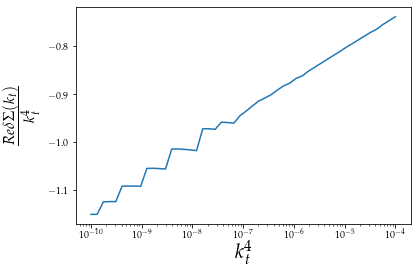

In [77]:
foo1.seTangDividePlot()

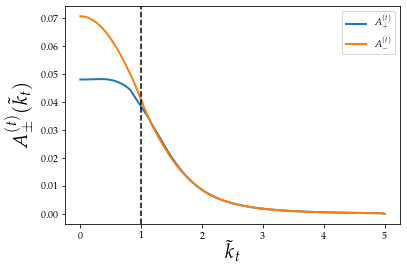

In [74]:
foo1.tangPlot()

In [54]:
foo1.uAlpha

-0.7484077981265701

In [55]:
ScalingPlots(h5py.File('tang10.h5','r')).uAlpha

-0.8800972398368513

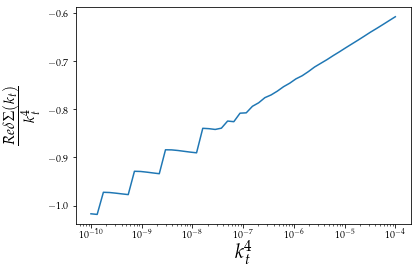

In [50]:
foo1.seTangDividePlot()

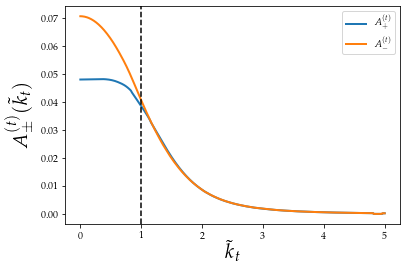

In [56]:
ScalingPlots(h5py.File('testQuartic4.h5','r')).tangPlot()

In [4]:
import glob

file_list = glob.glob('completeCalculationParallel*.h5')

In [5]:
alpha = []
u = []
for file_name in file_list:
    foo = ScalingPlots(h5py.File(file_name,'r'))
    alpha.append(foo.alpha)
    u.append(foo.uAlpha)

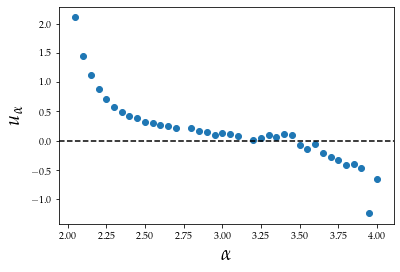

In [8]:
plt.scatter(alpha,u)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$u_{\alpha}$',fontsize=20)
plt.axhline(0.0,linestyle='--',color='black')
plt.savefig('Graphics/tangentialCoefficient.pdf',bbox_inches="tight")
plt.show()

In [9]:
alpha = []
etaPos = []
etaNeg = []
for file_name in file_list:
    foo = ScalingPlots(h5py.File(file_name,'r'))
    alpha.append(foo.alpha)
    etaPos.append(foo.etaRPlus)
    etaNeg.append(foo.etaRMinus)

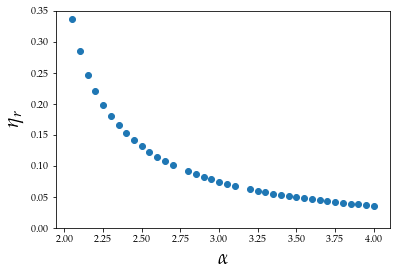

In [10]:
plt.scatter(alpha,etaPos)
#plt.scatter(alpha,etaNeg)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$\eta_r$',fontsize=20)
plt.ylim([0.0,0.35])
#plt.savefig('Graphics/radialEtaPos.pdf',bbox_inches="tight")
plt.show()

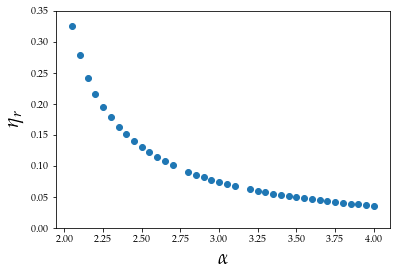

In [11]:
plt.scatter(alpha,etaNeg)
#plt.scatter(alpha,etaNeg)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$\eta_r$',fontsize=20)
plt.ylim([0.0,0.35])
#plt.savefig('Graphics/radialEtaPos.pdf',bbox_inches="tight")
plt.show()

In [12]:
alpha = []
aPos = []
aNeg = []
for file_name in file_list:
    foo = ScalingPlots(h5py.File(file_name,'r'))
    alpha.append(foo.alpha)
    aPos.append(foo.aPos)
    aNeg.append(foo.aNeg)

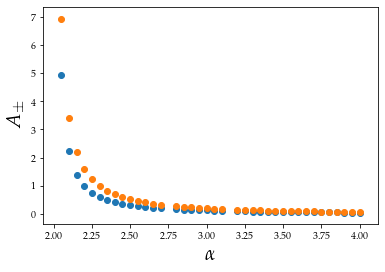

In [14]:
plt.scatter(alpha,aPos)
plt.scatter(alpha,aNeg)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$A_\pm$',fontsize=20)
#plt.ylim([0.0,0.35])
#plt.savefig('Graphics/radialEtaPos.pdf',bbox_inches="tight")
plt.show()

In [64]:
foo400 = ScalingPlots(h5py.File('prec8.h5','r'))
foo350 = ScalingPlots(h5py.File('popel350.h5','r'))
foo300 = ScalingPlots(h5py.File('popel300.h5','r'))
foo250 = ScalingPlots(h5py.File('popel250.h5','r'))

In [65]:
print(foo400.uAlpha)
print(foo350.uAlpha)
print(foo300.uAlpha)
print(foo250.uAlpha)

-0.6150791082969729
-0.08119280515288634
0.1308565941505897
0.31742173513678906


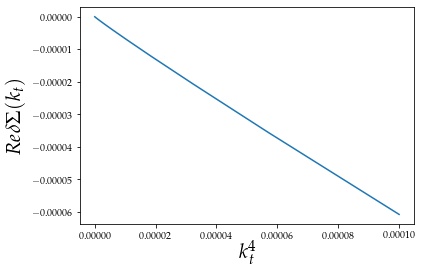

In [66]:
foo400.seTangQuarticPlot()

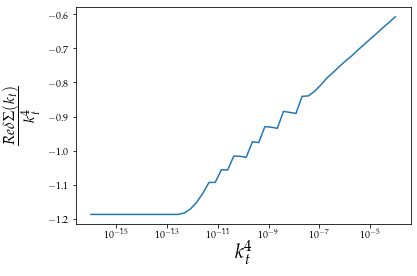

In [67]:
foo400.seTangDividePlot()

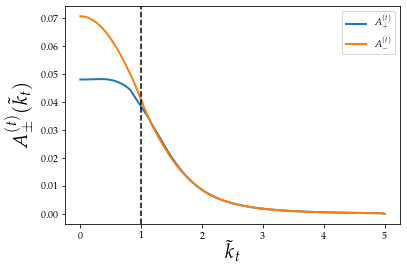

In [68]:
foo400.tangPlot()

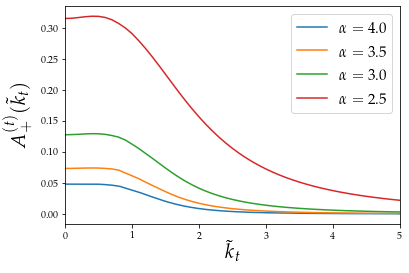

In [69]:
plt.plot(foo400.ktilde,foo400.atPos,label=r'$\alpha=4.0$')
plt.plot(foo350.ktilde,foo350.atPos,label=r'$\alpha=3.5$')
plt.plot(foo300.ktilde,foo300.atPos,label=r'$\alpha=3.0$')
plt.plot(foo250.ktilde,foo250.atPos,label=r'$\alpha=2.5$')
plt.xlabel(r'$\tilde{k}_t$',fontsize=20)
plt.ylabel(r'$A^{(t)}_+(\tilde{k}_t)$',fontsize=20)
plt.xlim([0.0,5])
#plt.ylim([-0.00005,0.00002])
plt.legend(fontsize=15)
plt.savefig('Graphics/tangScalePos.pdf',bbox_inches="tight")
plt.show()

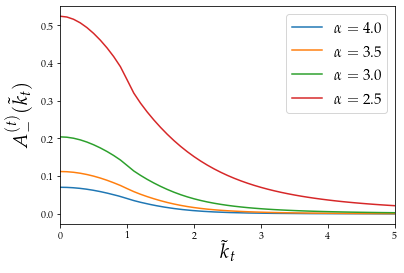

In [71]:
plt.plot(foo400.ktilde,foo400.atNeg,label=r'$\alpha=4.0$')
plt.plot(foo350.ktilde,foo350.atNeg,label=r'$\alpha=3.5$')
plt.plot(foo300.ktilde,foo300.atNeg,label=r'$\alpha=3.0$')
plt.plot(foo250.ktilde,foo250.atNeg,label=r'$\alpha=2.5$')
plt.xlabel(r'$\tilde{k}_t$',fontsize=20)
plt.ylabel(r'$A^{(t)}_-(\tilde{k}_t)$',fontsize=20)
plt.xlim([0.0,5])
#plt.ylim([-0.00005,0.00002])
plt.legend(fontsize=15)
plt.savefig('Graphics/tangScaleNeg.pdf',bbox_inches="tight")
plt.show()

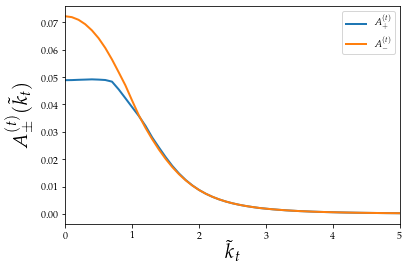

In [40]:
foo400.tangPlot()

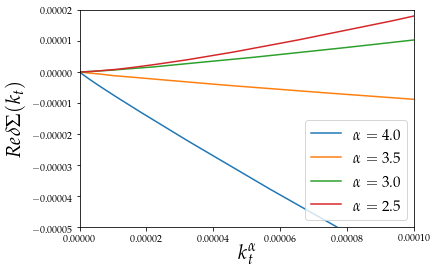

In [39]:
plt.plot(foo400.kt**foo400.alpha,foo400.seTang,label=r'$\alpha=4.0$')
plt.plot(foo350.kt**foo350.alpha,foo350.seTang,label=r'$\alpha=3.5$')
plt.plot(foo300.kt**foo300.alpha,foo300.seTang,label=r'$\alpha=3.0$')
plt.plot(foo250.kt**foo250.alpha,foo250.seTang,label=r'$\alpha=2.5$')
plt.xlabel(r'$k_t^\alpha$',fontsize=20)
plt.ylabel(r'$Re\delta\Sigma(k_t)$',fontsize=20)
plt.xlim([0.0,1e-4])
plt.ylim([-0.00005,0.00002])
plt.legend(fontsize=15)
#plt.savefig('Graphics/seTangMulti.pdf',bbox_inches="tight")
plt.show()

In [29]:
print(foo.aPos)
print(foo.aNeg)

0.048847662583573266
0.07220381455276309


In [34]:
print(foo.etaRPlus)
print(foo.etaRMinus)

0.035803282724181894
0.03567425797332329


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


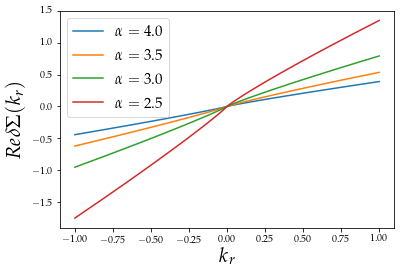

In [6]:
plt.plot(f400.fullK,f400.fullSe,label=r'$\alpha=4.0$')
plt.plot(f350.fullK,f350.fullSe,label=r'$\alpha=3.5$')
plt.plot(f300.fullK,f300.fullSe,label=r'$\alpha=3.0$')
plt.plot(f250.fullK,f250.fullSe,label=r'$\alpha=2.5$')
plt.xlabel(r'$k_r$',fontsize=20)
plt.ylabel(r'$Re\delta\Sigma(k_r)$',fontsize=20)
plt.legend(fontsize=15)
#plt.savefig('Graphics/radialSelfEnergy.pdf',bbox_inches="tight")
plt.show()

In [8]:
import glob

file_list = glob.glob('radialScale*.h5')

In [9]:
alpha = []
etaPos = []
etaNeg = []
for file_name in file_list:
    foo = ScalingPlots(h5py.File(file_name,'r'))
    alpha.append(foo.alpha)
    etaPos.append(foo.etaRPlus)
    etaNeg.append(foo.etaRMinus)

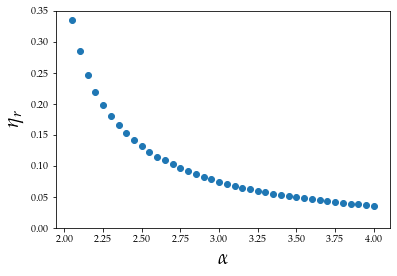

In [18]:
plt.scatter(alpha,etaPos)
#plt.scatter(alpha,etaNeg)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$\eta_r$',fontsize=20)
plt.ylim([0.0,0.35])
plt.savefig('Graphics/radialEtaPos.pdf',bbox_inches="tight")
plt.show()

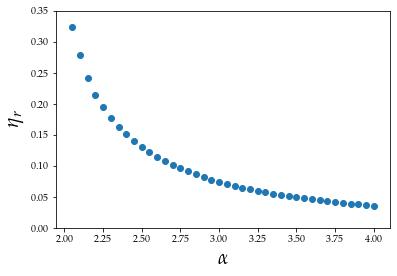

In [19]:
plt.scatter(alpha,etaNeg)
plt.xlabel(r'$\alpha$',fontsize=20)
plt.ylabel(r'$\eta_r$',fontsize=20)
plt.ylim([0.0,0.35])
plt.savefig('Graphics/radialEtaNeg.pdf',bbox_inches="tight")
plt.show()

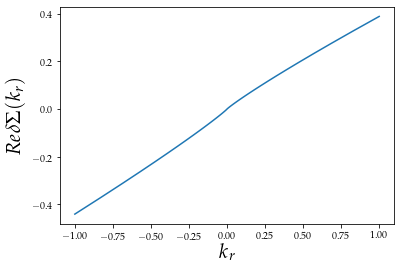

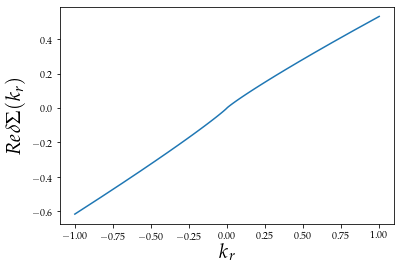

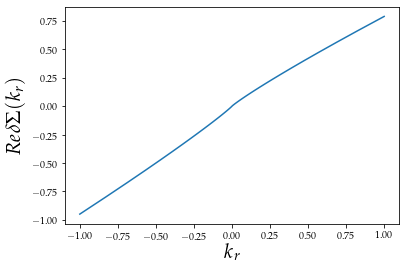

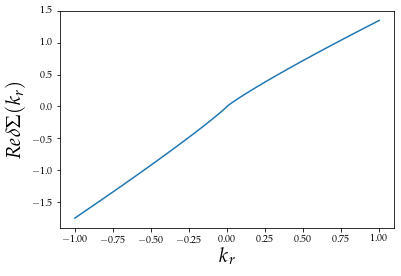

In [18]:
f400.seRadPlot()
f350.seRadPlot()
f300.seRadPlot()
f250.seRadPlot()

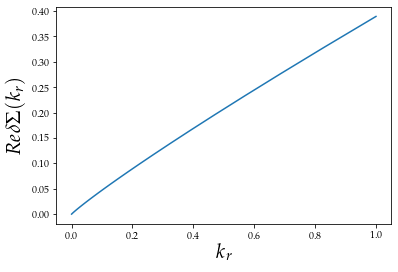

In [8]:
f400.seradPosPlot()

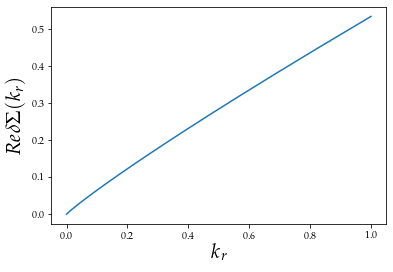

In [9]:
f350.seradPosPlot()

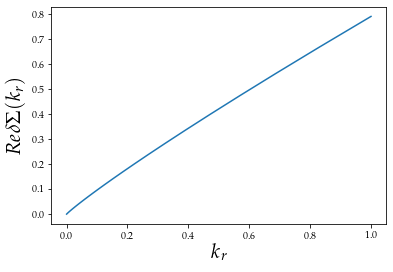

In [10]:
f300.seradPosPlot()

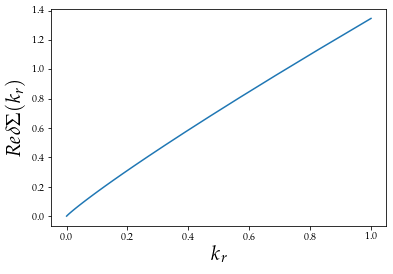

In [11]:
f250.seradPosPlot()

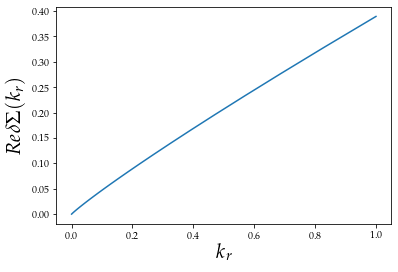

In [6]:
foo.seradPosPlot()

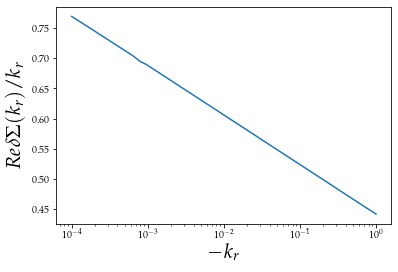

In [101]:
foo.seradNegLogPlot()

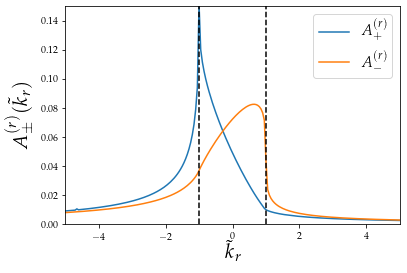

In [38]:
foo.radPlot()

In [43]:
kr = foo.kr
posRatio = foo.BPos/foo.kr
negRatio = -foo.BNeg/foo.kr
logKr = np.log(kr)

In [51]:
slope, intercept, r, p, std_err = stats.linregress(logKr, posRatio)
a=slope
b=intercept
print(a)
print(b)

-0.03571873526551164
0.3892880187527955


In [56]:
math.exp(10)

22026.465794806718

In [45]:
slope

-0.03571873526551164

In [46]:
slope, intercept, r, p, std_err = stats.linregress(logKr, negRatio)
print(slope)

-0.03557857996611255


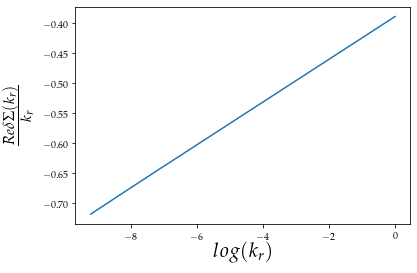

In [11]:
plt.plot(logKr,posRatio)
plt.xlabel(r'$log(k_r)$',fontsize=20)
plt.ylabel(r'$\frac{Re\delta\Sigma(k_r)}{k_r}$',fontsize=20)
plt.show()

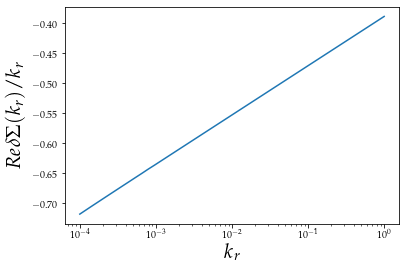

In [11]:
foo.seradPosLogPlot()

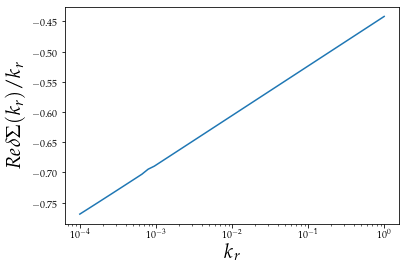

In [12]:
foo.seradNegLogPlot()

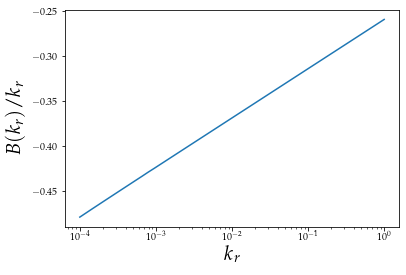

In [134]:
foo.BPosLogPlot()

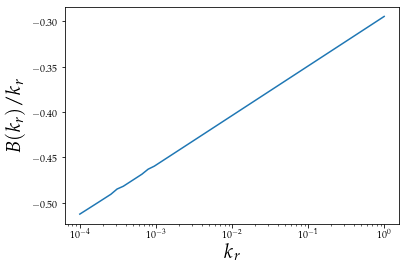

In [135]:
foo.BNegLogPlot()

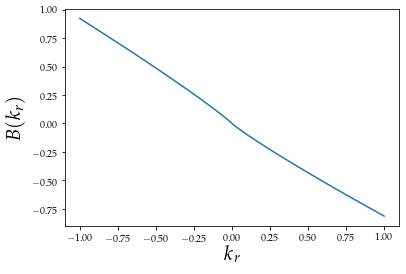

In [94]:
foo.BPlot()

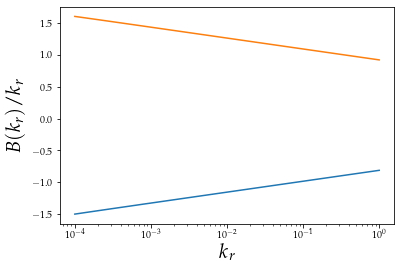

In [85]:
foo.BLogPlot()

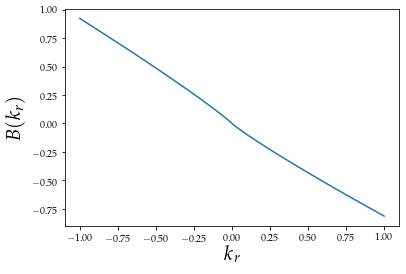

In [64]:
foo.BPlot()

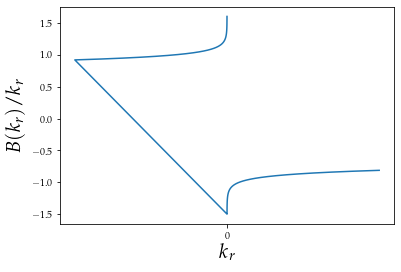

In [57]:
foo.BLogPlot()

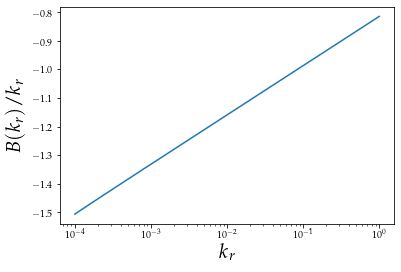

In [49]:
foo.BPosLogPlot()

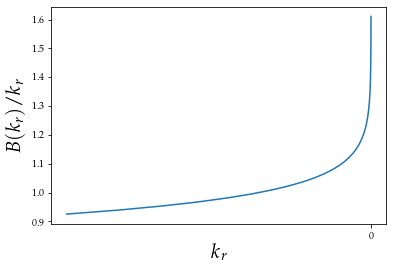

In [50]:
foo.BNegLogPlot()

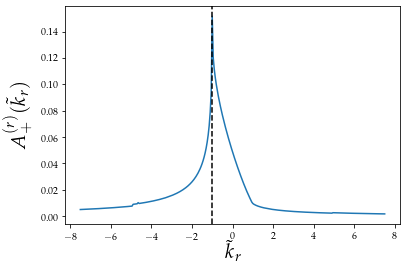

In [18]:
foo.radInterPosPlot()

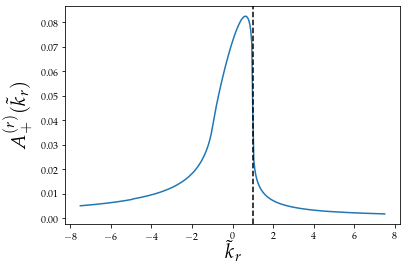

In [19]:
foo.radInterNegPlot()

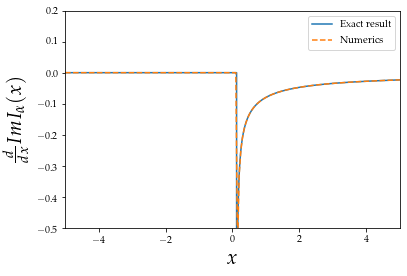

In [80]:
foo.imagDerivPlot()

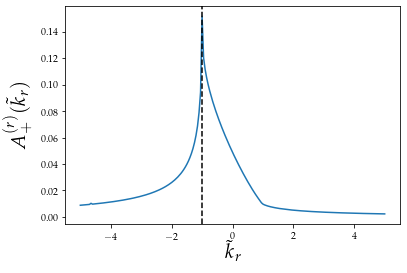

In [52]:
foo.radPosPlot()

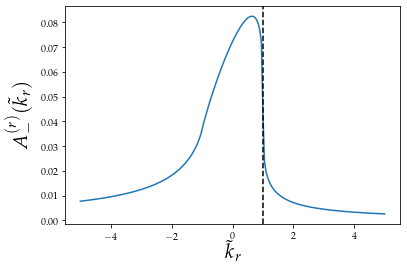

In [53]:
foo.radNegPlot()

In [4]:
at400 = ScalingPlots(h5py.File('radialScale400.h5','r'))
at360 = ScalingPlots(h5py.File('radialScale360.h5','r'))
at320 = ScalingPlots(h5py.File('radialScale320.h5','r'))
at280 = ScalingPlots(h5py.File('radialScale280.h5','r'))
at240 = ScalingPlots(h5py.File('radialScale240.h5','r'))

KeyError: "Unable to open object (object 'kr' doesn't exist)"

In [59]:
atlist = [at400,at360,at320,at280,at240]

In [60]:
mt = [4.00,3.6,3.2,2.8,2.4]

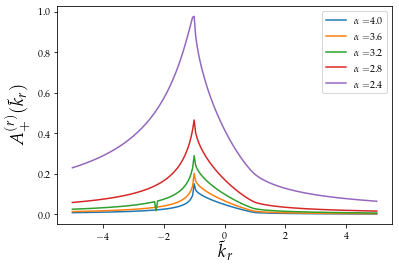

In [63]:
for i in range(len(atlist)):
    plt.plot(atlist[i].x,atlist[i].arpos,label=r'$\alpha =$' + str(mt[i]))
plt.xlabel(r'$\tilde{k}_r$',fontsize=18)
plt.ylabel(r'$A^{(r)}_+(\tilde{k}_r)$',fontsize=18)
plt.legend()
plt.savefig('Graphics/imagScale.pdf',bbox_inches="tight")
plt.show()

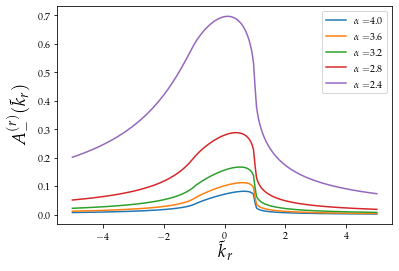

In [64]:
for i in range(len(atlist)):
    plt.plot(atlist[i].x,atlist[i].arneg,label=r'$\alpha =$' + str(mt[i]))
plt.xlabel(r'$\tilde{k}_r$',fontsize=18)
plt.ylabel(r'$A^{(r)}_-(\tilde{k}_r)$',fontsize=18)
plt.legend()
plt.savefig('Graphics/imagScale.pdf',bbox_inches="tight")
plt.show()

In [57]:
at400 = ScalingPlots(h5py.File('scaleFunction400.h5','r'))
at350 = ScalingPlots(h5py.File('scaleFunction350.h5','r'))
at300 = ScalingPlots(h5py.File('scaleFunction300.h5','r'))
at250 = ScalingPlots(h5py.File('scaleFunction250.h5','r'))
at200 = ScalingPlots(h5py.File('scaleFunction200.h5','r'))

KeyError: 'Unable to open object (component not found)'

In [4]:
foo = ScalingPlots(h5py.File('imagScale.h5','r'))

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


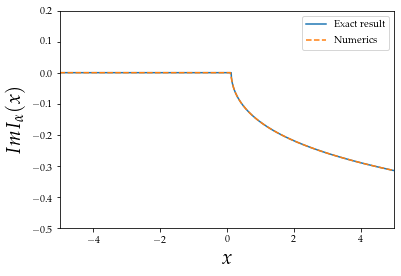

In [5]:
foo.imagPlot()

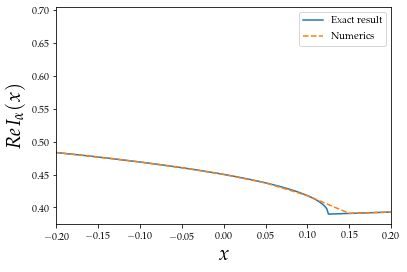

In [6]:
foo.realPlot()

In [6]:
atlist = [at400,at350,at300,at250,at200]

In [7]:
mt = [4.00,3.5,3.0,2.5,2.0]

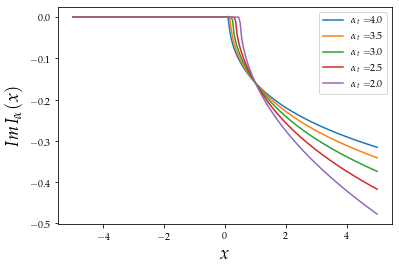

In [12]:
for i in range(len(atlist)):
    plt.plot(atlist[i].x,atlist[i].imagx,label=r'$\alpha =$' + str(mt[i]))
plt.xlabel(r'$x$',fontsize=18)
plt.ylabel(r'$ImI_{\alpha}(x)$',fontsize=18)
plt.legend()
plt.savefig('Graphics/imagScale.pdf',bbox_inches="tight")
plt.show()

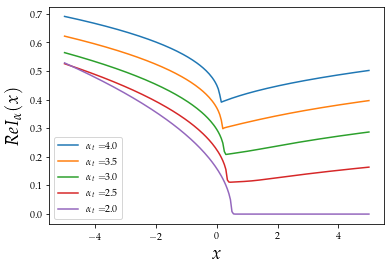

In [13]:
for i in range(len(atlist)):
    plt.plot(atlist[i].x,atlist[i].realx,label=r'$\alpha =$' + str(mt[i]))
plt.xlabel(r'$x$',fontsize=18)
plt.ylabel(r'$ReI_{\alpha}(x)$',fontsize=18)
plt.legend()
plt.savefig('Graphics/realScale.pdf',bbox_inches="tight")
plt.show()